# 1 Author

**Student Name**:  Sivasankari Rajamanickam

**Student ID**:  210965243



# 2 Problem formulation

The MLEnd Hums and Whistles Dataset consists of audios of eight different songs:

*   Potter
*   Starwars
*   Panther
*   Rain
*   Hakuna
*   Mamma
*   Showman
*   Rain

In this code notebook, we take audio sets of two songs, namely **Potter** & **StarWars**, and build a Machine Learning model, train the model with the dataset, and make it predict these songs accurately when Hummed or Whistled.

# 3 Machine Learning pipeline


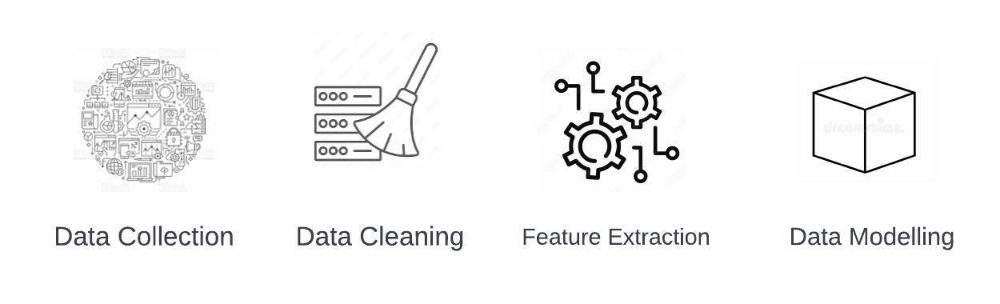

*   **Data Collection**

      The MLEnd Hums and Whistles Dataset is available in the Queen Mary Repository. We get the link for each song's dataset, develop an algorithm that downloads the zip file that contains all the data in .wav format and extracts it to the specified folder.

*   **Data Cleaning**

      The file names of the audio files extracted are then manipulated to suit a common format, thus preparing the names for further analysis and modelling.

*   **Feature Extraction**

      Each audio file is approximately 15 seconds long. To train the model, we snip each audio file into smaller samples. We then extract features from each audio file, namely power, pitch mean, pitch standard deviation, and the fraction of voiced region.


*   **Data Modelling**

      The dataset is divided into training and validation datasets. The features extracted from the audio files are fit into a ***Random Classifier Model*** and are trained and predicted against the split datasets for the same.

# 4 Transformation stage
This stage mainly focuses on extracting features from each song:

*   Power
*   Pitch Mean
*   Pitch Standard Deviation
*   Fraction of voiced region

The ML model is trained on a graph with the X and y-axis.

The features extracted are flattened into a 1D array, which will form the X-axis of the graph. The y-axis will take two Boolean values: 

*   True if the song is **Potter**
*   False if the song is **Starwars**

The graph is then plotted with the generated X and y values.

# 5 Modelling - Random Forest Classifier

We use Multiple classifier algorithms namely:


*   Support Vector Machine
*   Random Forest Classifier
*   Decision Tree Classifier
*   Gaussian Process Classifier   

On a conclusion, we note that Random Forest Classifier renders highest accuracy and 

We use decision trees on class labels (Potter, Starwars) to predict the output. But decision trees have problems like *bias* and *overfitting*. 

Overfitting occurs when the model tries to memorize the data rather than trying to generalise from making predictions on future data. 

Bias occurs when there is some degree of error in splitting the data. 

To fix this, we use ***Random Forest Classifier***. It uses an ensemble of decision trees to make predictions. For classification tasks, the random forest output is the class chosen by the majority of trees.


We use decision trees on class labels (Potter, Starwars) to predict the output. But decision trees have problems like *bias* and *overfitting*. 


Overfitting occurs when the model tries to memorize the data rather than trying to generalise from making predictions on future data. 

Bias occurs when there is some degree of error in splitting the data. 

To fix this, we use ***Random Forest Classifier***. It uses an ensemble of decision trees to make predictions. For classification tasks, the random forest output is the class chosen by the majority of trees.


# 6 Methodology

The dataset is split into training and validation dataset. (80% for training and 20% for Validation)

These dataset are then fed to train and validate the model developed using Random forest Classifier.

The following methodology is used to improve accuracy
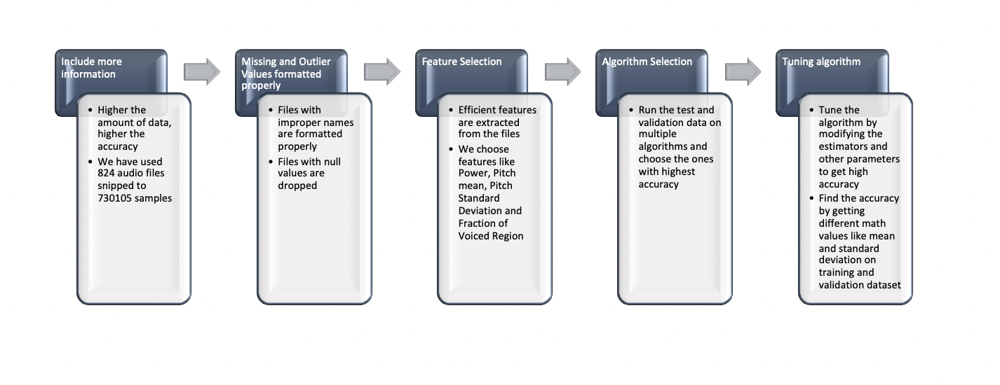

# 7 Dataset

The MLEnd Hums and Whistles dataset is used to perform this Machine Learning Project.

The Dataset consists of 8 songs:

1.   Potter
2.   Starwars
3.   Panther 
4.   Rain
5.   Hakuna
6.   Mamma
7.   Showman
8.   Frozen

Each song has been hummed and whistled and stored in the repository. This Dataset is available as *.zip* file.

**Data Collection :** We download the zip file for Potter and Starwars and store them in Google Drive. 

**Data Extraction:**  The zip file is then extracted to get the audios.
Each audio file is in the *.wav* format.

**Data Cleaning:** The files' names are not in proper format. We define an algorithm to fit all file names under a specific format to make proper contribution for analysis and training

**DataFrame Extraction:** Create a table from the file names and convert the table to a dataframe. This dataframe would contain information about the audio files. 





## 7.1 Environment Setup

In [1]:
from google.colab import drive

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import os, sys, re, pickle, glob
import urllib.request
import zipfile

import IPython.display as ipd
from tqdm import tqdm
import librosa

drive.mount('/content/drive')

Mounted at /content/drive


## 7.2 Data Collection
Download the data from the specified URL and store it in Google Drive

In [ ]:
def download_url(url, save_path):
    with urllib.request.urlopen(url) as dl_file:
        with open(save_path, 'wb') as out_file:
            out_file.write(dl_file.read())

In [ ]:
url  = "https://collect.qmul.ac.uk/down?t=6P0I5CAE7JPPKNDU/4P729FD6DFNO8IT4NNFR458"
save_path = '/content/drive/MyDrive/Data/Basic/MLEndHW_Potter1.zip'
download_url(url, save_path)

In [ ]:
url  = "https://collect.qmul.ac.uk/down?t=452THMOKUOST11V4/4L7IBFL5AJ3AMR45JVV9AC0"
save_path = '/content/drive/MyDrive/Data/Basic/MLEndHW_Potter2.zip'
download_url(url, save_path)

In [ ]:
url  = "https://collect.qmul.ac.uk/down?t=4HOGB7IH67J8QGL3/5D5TJMIP30DFVC69AQU5ETO"
save_path = '/content/drive/MyDrive/Data/Basic/MLEndHW_StarWars1.zip'
download_url(url, save_path)

In [ ]:
url  = "https://collect.qmul.ac.uk/down?t=4LUHB7IH67J8QGL3/6T5IF3SK8KQTL7FRD2113DO"
save_path = '/content/drive/MyDrive/Data/Basic/MLEndHW_StarWars2.zip'
download_url(url, save_path)

In [2]:
path = '/content/drive/MyDrive/Data/Basic'
os.listdir(path)

['MLEndHW_Potter2.zip',
 'MLEndHW_StarWars1.zip',
 'MLEndHW_StarWars2.zip',
 'Dataset',
 'MLEndHW_Potter1.zip']

## 7.3 Data Extraction
Extract the *.wav* audio files from the zip file to the specified Google Drive Location.

In [ ]:
def zip_extract(extract_to,zip_path):
  with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(directory_to_extract_to)

In [ ]:
directory_to_extract_to = '/content/drive/MyDrive/Data/Basic/Dataset/'
zip_extract(directory_to_extract_to,'/content/drive/MyDrive/Data/Basic/MLEndHW_Potter1.zip')
zip_extract(directory_to_extract_to,'/content/drive/MyDrive/Data/Basic/MLEndHW_Potter2.zip')
zip_extract(directory_to_extract_to,'/content/drive/MyDrive/Data/Basic/MLEndHW_StarWars1.zip')
zip_extract(directory_to_extract_to,'/content/drive/MyDrive/Data/Basic/MLEndHW_StarWars2.zip')

In [2]:
# The variable files contains the path to the audio files
sample_path = '/content/drive/MyDrive/Data/Basic/Dataset/*.wav'
files = glob.glob(sample_path)
len(files)

824

In [4]:
# Listen to the extracted audio files
for _ in range(5):
  n = np.random.randint(98)
  display(ipd.Audio(files[n]))

In [5]:
#visualise file names
for file in files:
  print(file.split('/')[-1])

S1_hum_2_Potter.wav
S1_whistle_2_Potter.wav
S2_hum_2_Potter.wav
S2_whistle_2_Potter.wav
S3_hum_1_Potter.wav
S3_hum_2_Potter.wav
S4_hum_1_Potter.wav
S4_hum_2_Potter.wav
S5_hum_1_Potter.wav
S5_hum_2_Potter.wav
S6_hum_2_Potter.wav
S6_whistle_2_Potter.wav
S7_hum_1_Potter.wav
S7_hum_2_Potter.wav
S8_hum_1_[Potter].wav
S8_hum_4_[Potter].wav
S9_hum_1_Potter.wav
S9_hum_2_Potter.wav
S10_hum_1_Potter .wav
S10_hum_2_Potter .wav
S12_hum_2_Potter .wav
S12_hum_4_Potter .wav
S13_hum_1_Potter.wav
S13_hum_2_Potter.wav
S15_hum_2_Potter.wav
S15_whistle_2_Potter.wav
S16_hum_2_Potter.wav
S16_whistle_2_Potter.wav
S17_hum_1_Potter.wav
S17_hum_2_Potter.wav
S18_Hum_2_Potter.wav
S18_Whistle_2_Potter.wav
S19_hum_1_Potter.wav
S19_hum_2_Potter.wav
S20_hum_1_Potter.wav
S20_hum_2_Potter.wav
S21_hum_1_Potter.wav
S21_hum_2_Potter.wav
S22_hum_1_Potter.wav
S22_hum_2_Potter.wav
S23_hum_1_Potter.wav
S23_hum_2_Potter.wav
S24_hum_2_Potter.wav
S24_whistle_2_Potter.wav
S25_hum_1_Potter.wav
S25_hum_2_Potter.wav
S26_hum_1_Potter

## 7.4 Data Cleaning and Dataframe Creation

The files with incorrect filenames are filtered down and manipulated to fit into proper names.

Properties like *File ID*, *File name*, *Interpretation Type*(Hum or Whistle) and *Song Name* are taken from the cleaned file name and appended into a Table.

This table which is in the list type is converted into **Pandas Dataframe** which contains the meta data of files.

In [3]:
MLENDHW_table = [] 
starwars_matches = ['star','stat','imperial']
whistle_matches = ['whistle','whisle','whislte']

i = 0
for file in files:
  file_name = file.split('/')[-1]
  file_name1 = file_name.lower()

  
  #SONG NAME
  if any(x in file_name1 for x in starwars_matches):
    song = "StarWars"
  elif "potter" in file_name1:
    song = "Potter"
  else:
    song = "None"

  
  #INTERPRETATION TYPE
  if "hum" in file_name1:
    interpretation_type = "Hum"
  elif any(x in file_name1 for x in whistle_matches):
    interpretation_type = "Whistle"
  else:
    interpretation_type = "None"

  if song == 'None' or interpretation_type == 'None':
    pass
  else:
    file_id = i
    i+=1
    MLENDHW_table.append([file_id,file_name,song,interpretation_type])

MLENDHW_table

[[0, 'S1_hum_2_Potter.wav', 'Potter', 'Hum'],
 [1, 'S1_whistle_2_Potter.wav', 'Potter', 'Whistle'],
 [2, 'S2_hum_2_Potter.wav', 'Potter', 'Hum'],
 [3, 'S2_whistle_2_Potter.wav', 'Potter', 'Whistle'],
 [4, 'S3_hum_1_Potter.wav', 'Potter', 'Hum'],
 [5, 'S3_hum_2_Potter.wav', 'Potter', 'Hum'],
 [6, 'S4_hum_1_Potter.wav', 'Potter', 'Hum'],
 [7, 'S4_hum_2_Potter.wav', 'Potter', 'Hum'],
 [8, 'S5_hum_1_Potter.wav', 'Potter', 'Hum'],
 [9, 'S5_hum_2_Potter.wav', 'Potter', 'Hum'],
 [10, 'S6_hum_2_Potter.wav', 'Potter', 'Hum'],
 [11, 'S6_whistle_2_Potter.wav', 'Potter', 'Whistle'],
 [12, 'S7_hum_1_Potter.wav', 'Potter', 'Hum'],
 [13, 'S7_hum_2_Potter.wav', 'Potter', 'Hum'],
 [14, 'S8_hum_1_[Potter].wav', 'Potter', 'Hum'],
 [15, 'S8_hum_4_[Potter].wav', 'Potter', 'Hum'],
 [16, 'S9_hum_1_Potter.wav', 'Potter', 'Hum'],
 [17, 'S9_hum_2_Potter.wav', 'Potter', 'Hum'],
 [18, 'S10_hum_1_Potter .wav', 'Potter', 'Hum'],
 [19, 'S10_hum_2_Potter .wav', 'Potter', 'Hum'],
 [20, 'S12_hum_2_Potter .wav', 'Potter

In [4]:
MLENDHW_df = pd.DataFrame(MLENDHW_table,columns=['file_id','file_name','song','interpretation'])
MLENDHW_df

,file_id,file_name,song,interpretation
0,0,S1_hum_2_Potter.wav,Potter,Hum
1,1,S1_whistle_2_Potter.wav,Potter,Whistle
2,2,S2_hum_2_Potter.wav,Potter,Hum
3,3,S2_whistle_2_Potter.wav,Potter,Whistle
4,4,S3_hum_1_Potter.wav,Potter,Hum
...,...,...,...,...
819,819,S219_hum_4_StarWars.wav,StarWars,Hum
820,820,S221_hum_1_StartWars.wav,StarWars,Hum
821,821,S221_hum_2_StarWars.wav,StarWars,Hum
822,822,S222_hum_2_StarWars.wav,StarWars,Hum


# 8 Results



## 8.1 Feature Extraction
Audio files are approximately 15 seconds long. Each audio files is sampled into smaller snippets. Here we acquire 730105 samples from 824 audio files.

We then extract features - power, pitch mean, pitch standard deviation and fraction of voiced region for each sample.

These features are used to identify each songs.

This audio signal has 730105 samples


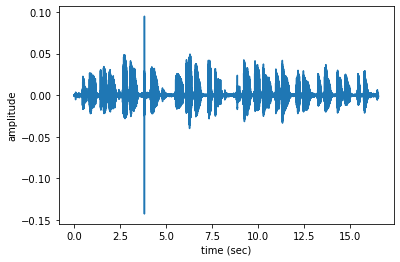

In [8]:
#Check the number of samples in the audio set
n=0
fs = None #If None fs is 22050
x, fs = librosa.load(files[n],sr=fs)
print('This audio signal has', len(x), 'samples')
t = np.arange(len(x))/fs
plt.plot(t,x)
plt.xlabel('time (sec)')
plt.ylabel('amplitude')
plt.show()
display(ipd.Audio(files[n]))

This cell defines an algorithm to get the pitch value. The function takes three arguments as inputs:
* ***x*** - samples of audio files
* ***fs*** - sample frequency
* ***winLen*** - autocorrelation of samples. This value is set to a default value of 0.2.

The output of the function is as follows:
* ***f0*** - a series that contains the fundamental frequencies. This is in Hertz.
* ***voiced_flag*** - Series of boolean values indicating if the frame is flagged

In [9]:
def getPitch(x,fs,winLen=0.02): 
  p = winLen*fs
  frame_length = int(2**int(p-1).bit_length())
  hop_length = frame_length//2
  f0, voiced_flag, voiced_probs = librosa.pyin(y=x, fmin=80, fmax=450, sr=fs,
                                                 frame_length=frame_length,hop_length=hop_length)
  return f0,voiced_flag

The following function defines an algorithm to generate the features -X and labels- y values for training and validating the ML Model.

The input to the function is as follows:

* ***files*** - a list of paths to the audio files
* ***labels_files*** - data frame that consists of metadata (file ID, file name, interpretation type, song) of each audio file.
* ***scale_audio*** - the audio samples are scaled between -1 and 1 if set as True and samples are retained with the original value if set to False. This value is defaulted to *False*.
* ***onlySingleDigit*** - accepts only single digits if set to True. This value is defaulted to *False*.

The function returns the following values:

* ***X*** - NumPy array of 4 extracted features
* ***y*** - NumPy array of labels (1 - Potter, 0 - Starwars)

In [10]:
def getXy(files,labels_file, scale_audio=False, onlySingleDigit=False):
  X,y =[],[]
  for file in tqdm(files):
    a = labels_file.index[labels_file['file_name'] == file.split('/')[-1]].tolist()
    yi = labels_file.loc[a]['song']=='Potter'

    fs = None # if None, fs would be 22050
    x, fs = librosa.load(file,sr=fs)
    if scale_audio: x = x/np.max(np.abs(x))
    f0, voiced_flag = getPitch(x,fs,winLen=0.02)
      
    power = np.sum(x**2)/len(x)
    pitch_mean = np.nanmean(f0) if np.mean(np.isnan(f0))<1 else 0
    pitch_std  = np.nanstd(f0) if np.mean(np.isnan(f0))<1 else 0
    voiced_fr = np.mean(voiced_flag)

    xi = [power,pitch_mean,pitch_std,voiced_fr]
    X.append(xi)
    y.append(yi)

  return np.array(X),np.array(y)

In [11]:
#get the X and y arrays
X,y = getXy(files, labels_file=MLENDHW_df, scale_audio=True, onlySingleDigit=True)

100%|██████████| 824/824 [45:37<00:00,  3.32s/it]


In [12]:
#check the number of each labels(Potter, Starwars)
print(' The number of Potter recordings is ', np.count_nonzero(y))
print(' The number of StarWars recordings is ', y.size - np.count_nonzero(y))

 The number of Potter recordings is  411
 The number of StarWars recordings is  413


In [21]:
#prints the shape of np arrays (no. of lines, no. of columns)
print('The shape of X is', X.shape) 
print('The shape of y is', y.shape)


The shape of X is (824, 4)
The shape of y is (824, 1)


## 8.2 Model Training and Validation

In [13]:
from sklearn.model_selection import train_test_split

from sklearn import svm

from sklearn.ensemble import RandomForestClassifier
from sklearn import metrics

from sklearn.tree import DecisionTreeClassifier
from sklearn import tree

from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF

In [14]:
X_train, X_val, y_train, y_val = train_test_split(X,y,test_size=0.2)
X_train.shape, X_val.shape, y_train.shape, y_val.shape

((659, 4), (165, 4), (659, 1), (165, 1))

In [29]:
models = [svm.SVC(C=1), 
          RandomForestClassifier(max_depth=30, n_estimators=100),
          tree.DecisionTreeClassifier(criterion='entropy',max_depth=4,max_leaf_nodes=10),
          GaussianProcessClassifier()]
for model in models:
  model_name=type(model).__name__
  print("*** Accuracy for: ", model_name,"***")
  class_model = model
  model.fit(X_train,y_train.ravel())
  y_train_pred = model.predict(X_train)
  y_val_pred = model.predict(X_val)
  print('Training Accuracy', np.mean(y_train_pred==y_train))
  print('Validation  Accuracy', np.mean(y_val_pred==y_val))
  print("-----------------------------------")

*** Accuracy for:  SVC ***
Training Accuracy 0.499989638045413
Validation  Accuracy 0.5002754820936639
-----------------------------------
*** Accuracy for:  RandomForestClassifier ***
Training Accuracy 0.500010361954587
Validation  Accuracy 0.5004591368227732
-----------------------------------
*** Accuracy for:  DecisionTreeClassifier ***
Training Accuracy 0.49968568737752744
Validation  Accuracy 0.5002754820936639
-----------------------------------
*** Accuracy for:  GaussianProcessClassifier ***
Training Accuracy 0.500010361954587
Validation  Accuracy 0.49990817263544535
-----------------------------------


## 8.3 Accuracy Tuning

We try to increase the accuracy by normalising the values based on mean and standard deviation.

In [28]:
models = [svm.SVC(C=1), 
          RandomForestClassifier(max_depth=30, n_estimators=100),
          tree.DecisionTreeClassifier(criterion='entropy',max_depth=4,max_leaf_nodes=10),
          GaussianProcessClassifier()]
for model in models:
  model_name=type(model).__name__
  print("*** Accuracy for: ", model_name," after normalisation. ***")
  mean = X_train.mean(0)
  sd =  X_train.std(0)
  X_train = (X_train-mean)/sd
  X_val  = (X_val-mean)/sd
  class_model = model
  model.fit(X_train,y_train.ravel())
  y_train_pred = model.predict(X_train)
  y_val_pred = model.predict(X_val)
  print('Training Accuracy', np.mean(y_train_pred==y_train))
  print('Validation  Accuracy', np.mean(y_val_pred==y_val))
  print("-----------------------------------")

*** Accuracy for:  SVC  after normalisation. ***
Training Accuracy 0.499989638045413
Validation  Accuracy 0.5002754820936639
-----------------------------------
*** Accuracy for:  RandomForestClassifier  after normalisation. ***
Training Accuracy 0.500010361954587
Validation  Accuracy 0.49990817263544535
-----------------------------------
*** Accuracy for:  DecisionTreeClassifier  after normalisation. ***
Training Accuracy 0.49968568737752744
Validation  Accuracy 0.5002754820936639
-----------------------------------
*** Accuracy for:  GaussianProcessClassifier  after normalisation. ***
Training Accuracy 0.500010361954587
Validation  Accuracy 0.49990817263544535
-----------------------------------


# 9 Conclusions

After running training and vaidation on multiple algorithms, Random Forest Classifier seems to give highest accuracy.

The accuracies are neither overfitting nor under fitting.

This ML model gives 50% accuracy on training anf 50% accuracy on validation dataset. Hence the ML could be concluded to predict if the sound is potter or starwars to a greater extent. 

As a conclusion, the accuracy of the ML model could be improved by adding more data to the training and validation dataset.